In [1]:
!apt-get install libgl1-mesa-glx -y

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgl1-mesa-glx is already the newest version (20.0.8-0ubuntu1~18.04.1).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [2]:
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [3]:
import os
import sys
from glob import glob
import numpy as np
import pandas as pd
import cv2
from PIL import Image
from tqdm.notebook import tqdm
from time import time

import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
class cfg:
    data_dir = 'input/data/train'
    img_dir = f'{data_dir}/images'
    df_path = f'{data_dir}/train.csv'

In [5]:
num2class = ['incorrect_mask', 'mask1', 'mask2', 'mask3',
             'mask4', 'mask5', 'normal']
class2num = {k: v for v, k in enumerate(num2class)}

df = pd.read_csv(cfg.df_path)
df.head()

,id,gender,race,age,path
0,000001,female,Asian,45,000001_female_Asian_45
1,000002,female,Asian,52,000002_female_Asian_52
2,000004,male,Asian,54,000004_male_Asian_54
3,000005,female,Asian,58,000005_female_Asian_58
4,000006,female,Asian,59,000006_female_Asian_59


In [6]:
os.path.isdir("input")

True

In [7]:
def get_ext(img_dir, img_id):
    """
    학습 데이터셋 이미지 폴더에는 여러 하위폴더로 구성되고, 이 하위폴더들에는 각 사람의 사진들이 들어가있습니다. 하위폴더에 속한 이미지의 확장자를 구하는 함수입니다.
    
    Args:
        img_dir: 학습 데이터셋 이미지 폴더 경로 
        img_id: 학습 데이터셋 하위폴더 이름

    Returns:
        ext: 이미지의 확장자
    """
    filename = os.listdir(os.path.join(img_dir, img_id))[0]
    ext = os.path.splitext(filename)[-1].lower()
    return ext

In [8]:
def get_img_stats(img_dir, img_ids):
    """
    데이터셋에 있는 이미지들의 크기와 RGB 평균 및 표준편차를 수집하는 함수입니다.
    
    Args:
        img_dir: 학습 데이터셋 이미지 폴더 경로 
        img_ids: 학습 데이터셋 하위폴더 이름들

    Returns:
        img_info: 이미지들의 정보 (크기, 평균, 표준편차)
    """
    img_info = dict(heights=[], widths=[], means=[], stds=[])
    for img_id in tqdm(img_ids):
        for path in glob(os.path.join(img_dir, img_id, '*')):
            img = np.array(Image.open(path))
            h, w, _ = img.shape
            img_info['heights'].append(h)
            img_info['widths'].append(w)
            img_info['means'].append(img.mean(axis=(0,1)))
            img_info['stds'].append(img.std(axis=(0,1)))
    return img_info

In [9]:
# img_info = get_img_stats(cfg.img_dir, df.path.values)

# print(f'Total number of people is {len(df)}')
# print(f'Total number of images is {len(df) * 7}')

# print(f'Minimum height for dataset is {np.min(img_info["heights"])}')
# print(f'Maximum height for dataset is {np.max(img_info["heights"])}')
# print(f'Average height for dataset is {int(np.mean(img_info["heights"]))}')
# print(f'Minimum width for dataset is {np.min(img_info["widths"])}')
# print(f'Maximum width for dataset is {np.max(img_info["widths"])}')
# print(f'Average width for dataset is {int(np.mean(img_info["widths"]))}')

# print(f'RGB Mean: {np.mean(img_info["means"], axis=0) / 255.}')
# print(f'RGB Standard Deviation: {np.mean(img_info["stds"], axis=0) / 255.}')

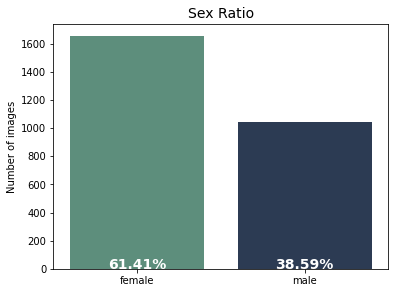

In [10]:
plt.figure(figsize=(6, 4.5)) 
ax = sns.countplot(x = 'gender', data = df, palette=["#55967e", "#263959"])

plt.xticks( np.arange(2), ['female', 'male'] )
plt.title('Sex Ratio',fontsize= 14)
plt.xlabel('')
plt.ylabel('Number of images')

counts = df['gender'].value_counts()
counts_pct = [f'{elem * 100:.2f}%' for elem in counts / counts.sum()]
for i, v in enumerate(counts_pct):
    ax.text(i, 0, v, horizontalalignment = 'center', size = 14, color = 'w', fontweight = 'bold')
    
plt.show()

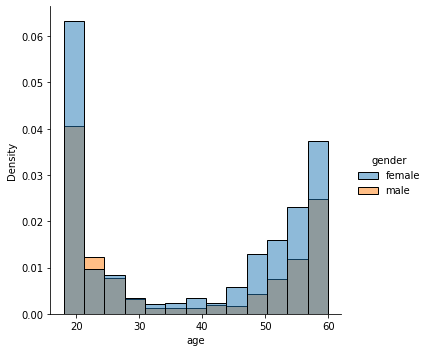

In [11]:
sns.displot(df, x="age", hue="gender", stat="density")

In [12]:
img_id = df.iloc[500].path
ext = get_ext(cfg.img_dir, img_id)

Text(0.5, 1.0, 'Class Grayscale Histogram Plot')

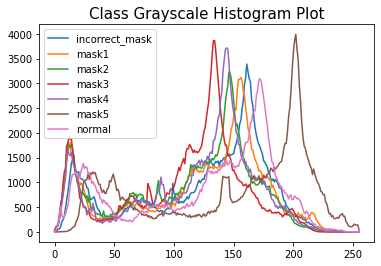

In [13]:
plt.figure()
plt.subplot(111)

for class_id in num2class:
    img = np.array(Image.open(os.path.join(cfg.img_dir, img_id, class_id+ext)).convert('L'))
    histogram, bin_edges = np.histogram(img, bins=256, range=(0, 255))
    sns.lineplot(data=histogram)

plt.legend(num2class)
plt.title('Class Grayscale Histogram Plot', fontsize=15)

Text(0.5, 1.0, 'Class Grayscale Histogram Plot')

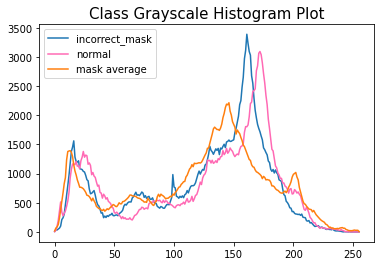

In [14]:
plt.figure()
plt.subplot(111)

img = np.array(Image.open(os.path.join(cfg.img_dir, img_id, 'incorrect_mask'+ext)).convert('L'))
histogram, bin_edges = np.histogram(img, bins=256, range=(0, 255))
sns.lineplot(data=histogram)

img = np.array(Image.open(os.path.join(cfg.img_dir, img_id, 'normal'+ext)).convert('L'))
histogram, bin_edges = np.histogram(img, bins=256, range=(0, 255))
sns.lineplot(data=histogram, color='hotpink')

histograms = []
for i in range(1, 6):
    img = np.array(Image.open(os.path.join(cfg.img_dir, img_id, num2class[i]+ext)).convert('L'))
    histogram, bin_edges = np.histogram(img, bins=256, range=(0, 255))
    histograms.append(histogram)
sns.lineplot(data=np.mean(histograms, axis=0))

plt.legend(['incorrect_mask', 'normal', 'mask average'])
plt.title('Class Grayscale Histogram Plot', fontsize=15)

No handles with labels found to put in legend.


Text(0.5, 1.0, 'RGB Histogram Plot - Normal')

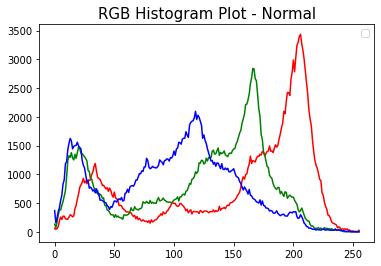

In [15]:
plt.figure()
plt.subplot(111)

img = np.array(Image.open(os.path.join(cfg.img_dir, img_id, 'normal'+ext)))
colormap = ['red', 'green', 'blue']
for i in range(3):
    histogram, bin_edges = np.histogram(img[..., i], bins=256, range=(0, 255))
    sns.lineplot(data=histogram, color=colormap[i])

plt.legend()
plt.title('RGB Histogram Plot - Normal', fontsize=15)

In [16]:
def plot_raw_images(img_dir, img_id):
    """
    마스크 미착용 이미지를 시각화하는 함수입니다.
    
    Args:
        img_dir: 학습 데이터셋 이미지 폴더 경로 
        img_id: 학습 데이터셋 하위폴더 이름
    """
    ext = get_ext(img_dir, img_id)
    img = np.array(Image.open(os.path.join(img_dir, img_id, 'normal' + ext)))
    
    plt.figure(figsize=(6,6))
    plt.imshow(img)

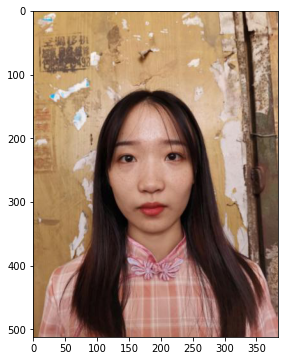

In [17]:
plot_raw_images(cfg.img_dir, img_id)

In [18]:
def plot_mask_images(img_dir, img_id):
    """
    마스크 정상착용 5장과 이상하게 착용한 1장을 2x3의 격자에 시각화하는 함수입니다.
    
    Args:
        img_dir: 학습 데이터셋 이미지 폴더 경로 
        img_id: 학습 데이터셋 하위폴더 이름
    """
    ext = get_ext(img_dir, img_id)
    imgs = [np.array(Image.open(os.path.join(img_dir, img_id, class_name + ext))) for class_name in num2class[:-1]]
    
    n_rows, n_cols = 2, 3
    fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(15, 12))
    for i in range(n_rows*n_cols):
        axes[i//(n_rows+1)][i%n_cols].imshow(imgs[i])
        axes[i//(n_rows+1)][i%n_cols].set_title(f'{num2class[i]}', color='r')
    plt.tight_layout()

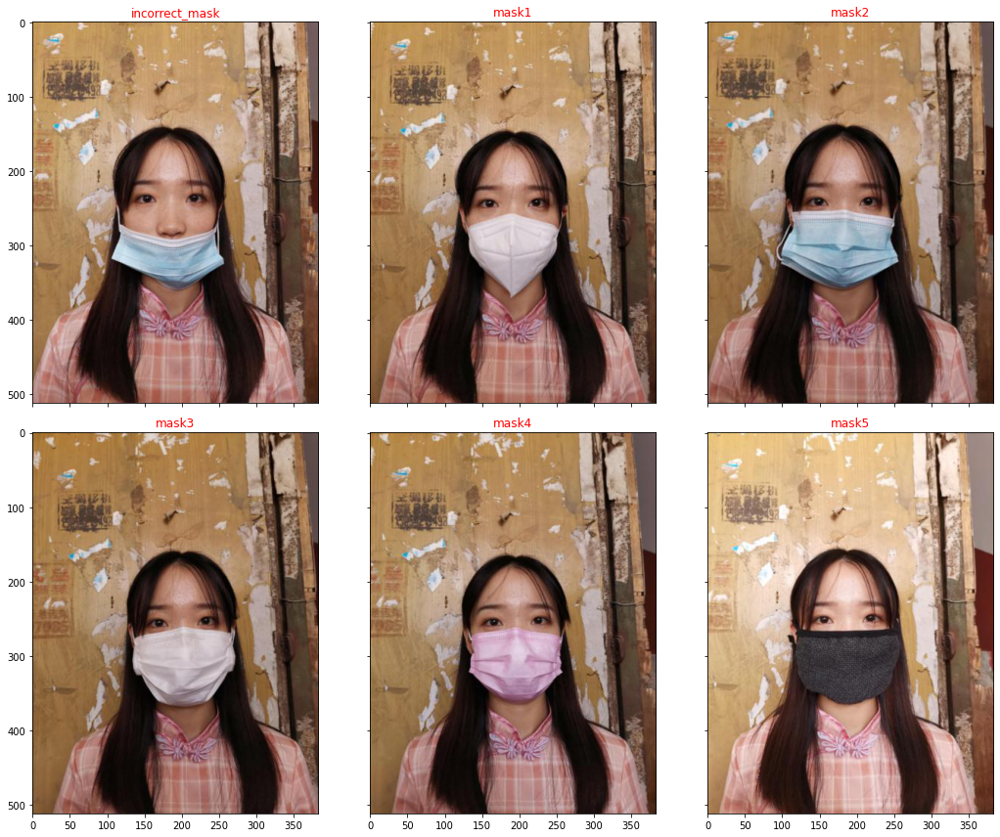

In [19]:
plot_mask_images(cfg.img_dir, img_id)

3. (Optional) Extra Analysis
파트 3에서는 조금 특수한 분석을 해봅시다. 이 부분은 강의 내용을 벗어나는 코드가 포함되어 있으므로 생략하셔도 괜찮습니다. ### 3.1 Face Detection
사람 얼굴을 찾는데 딥러닝이 사용되기 이전에, Haar Cascade라는 방법이 많이 사용되었습니다. 이 방법을 이용하여 간단하게 결과를 시각화 해봅시다.
코드가 제대로 실행이 되지않는다면, opencv에서 제공하는 haarcascade_frontalface_default.xml파일을 현재 경로에 받아야합니다.

In [20]:
!apt-get install -y curl

Reading package lists... Done
Building dependency tree       
Reading state information... Done
curl is already the newest version (7.58.0-2ubuntu3.12).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [21]:
!curl -L -o ./haarcascade_frontalface_default.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  908k  100  908k    0     0  1802k      0 --:--:-- --:--:-- --:--:-- 1805k


In [22]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

In [23]:
imgs = []
for class_id in num2class:
    img = np.array(Image.open(os.path.join(cfg.img_dir, img_id, class_id+ext)))
    imgs.append(img)
imgs = np.array(imgs)

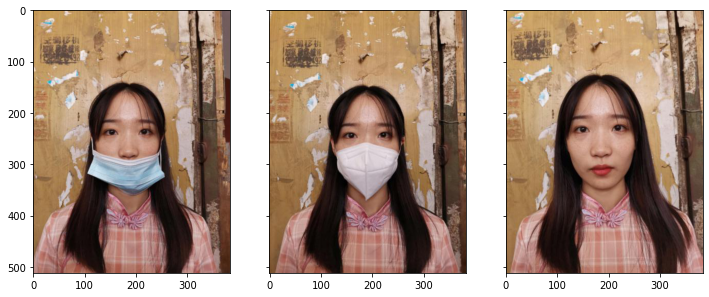

In [24]:
fig, axes = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(12, 6))
axes[0].imshow(imgs[0])
axes[1].imshow(imgs[1])
axes[2].imshow(imgs[-1])

In [25]:
for img in imgs:
    face_bbox = face_cascade.detectMultiScale(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 1.1, 4)
    for (x, y, w, h) in face_bbox:
        cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 4)

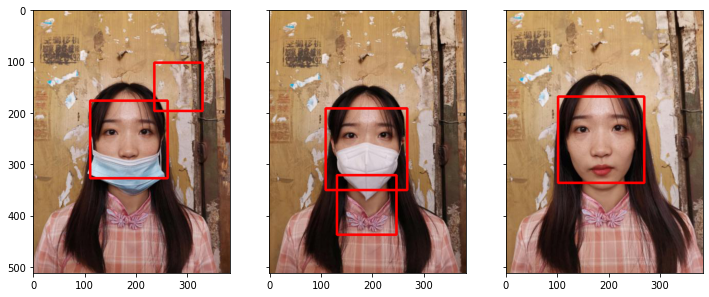

In [26]:
fig, axes = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(12, 6))
axes[0].imshow(imgs[0])
axes[1].imshow(imgs[1])
axes[2].imshow(imgs[-1])

DataAugmentation 시작

In [27]:
!pip install albumentations

In [28]:
import os
import sys
from glob import glob
import requests
import random
import numpy as np
import pandas as pd
import cv2
from PIL import Image
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from time import time

from albumentations import *

import matplotlib.pyplot as plt
import seaborn as sns

In [29]:
ls -al input/data/eval/images/* | grep "^ㅇ"

In [30]:
data_dir = cfg.img_dir
img_path = f'{data_dir}/003101_female_Asian_18/mask4.jpg'
img = np.array(Image.open(img_path))

img_paths = glob(os.path.join(f'{data_dir}', '**/*'))
print(len(img_paths))
random.shuffle(img_paths)

18900


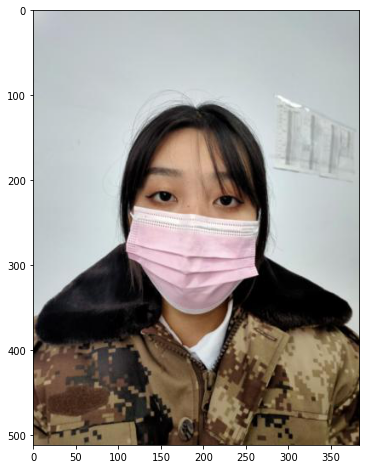

In [31]:
plt.figure(figsize=(16,8))
plt.imshow(img)

이미지를 좌우, 상하 반전

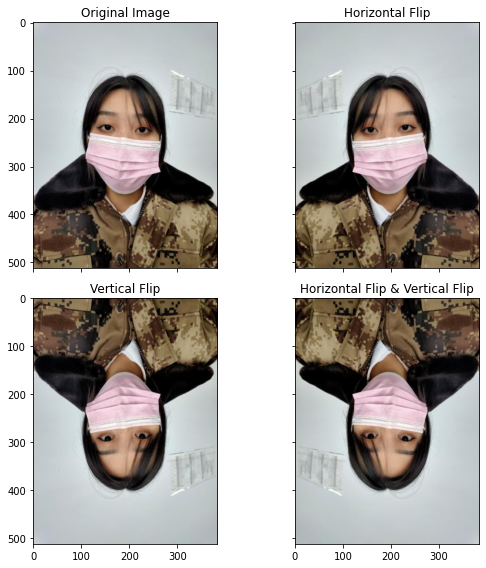

In [32]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

axes[0][0].imshow(img)
axes[0][0].set_title(f'Original Image')

trfm = Compose([
            HorizontalFlip(p=1.0),
        ], p=1.0)
axes[0][1].imshow(trfm(image=img)['image'])
axes[0][1].set_title(f'Horizontal Flip')

trfm = Compose([
            VerticalFlip(p=1.0),
        ], p=1.0)
axes[1][0].imshow(trfm(image=img)['image'])
axes[1][0].set_title(f'Vertical Flip')

trfm = Compose([
            HorizontalFlip(p=1.0),
            VerticalFlip(p=1.0),
        ], p=1.0)
axes[1][1].imshow(trfm(image=img)['image'])
axes[1][1].set_title(f'Horizontal Flip & Vertical Flip')

plt.tight_layout()

이미지를 동일한 크기로 랜덤하게 잘라냄

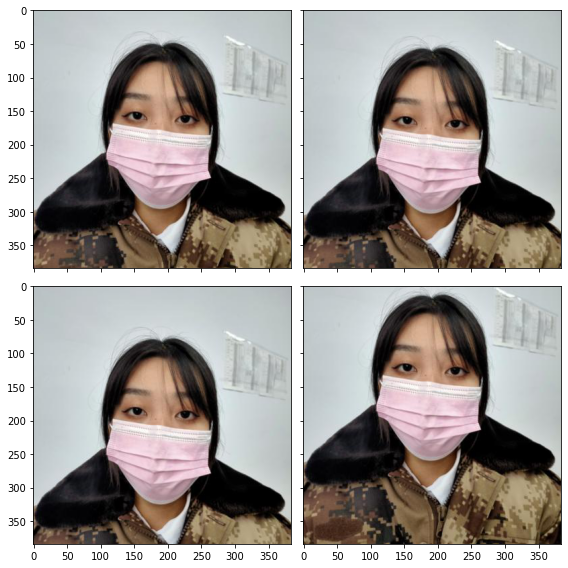

In [33]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([
            RandomCrop(height=384, width=384, p=1.0),
        ], p=1.0)
for i in range(n_rows*n_cols):
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)['image'])

plt.tight_layout()

이미지를 랜덤하게 Affine Transform 시킨다.

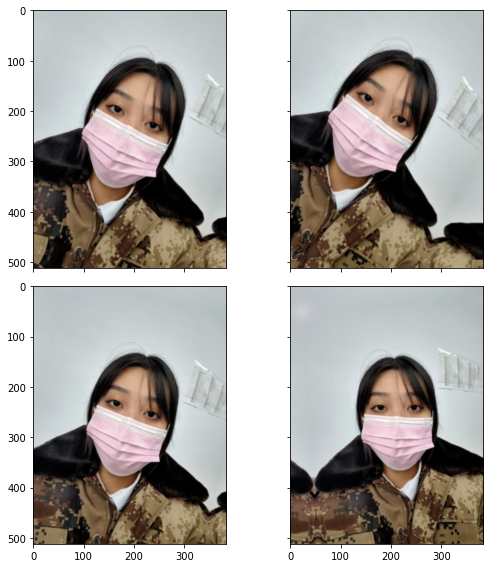

In [34]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([
            ShiftScaleRotate(p=1.0),
        ], p=1.0)
for i in range(n_rows*n_cols):
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)['image'])

plt.tight_layout()

이미지의 밝기와 대조를 랜덤하게 변화

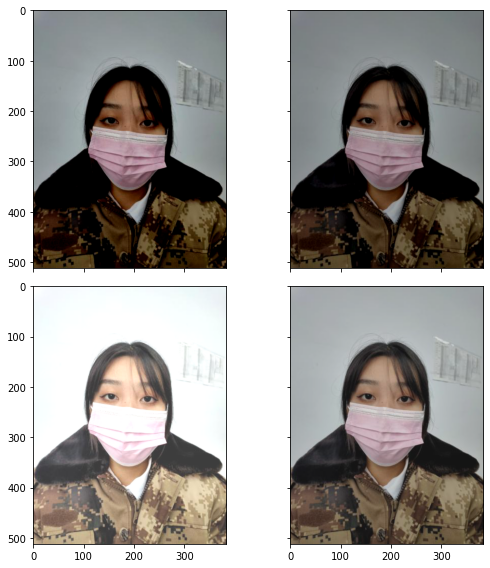

In [35]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([
            RandomBrightnessContrast(brightness_limit=(-0.3, 0.3), contrast_limit=(-0.3, 0.3), p=1.0),
        ], p=1.0)
for i in range(n_rows*n_cols):
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)['image'])

plt.tight_layout()

이미지에 랜덤하게 가우시안 노이즈를 씌운다운다

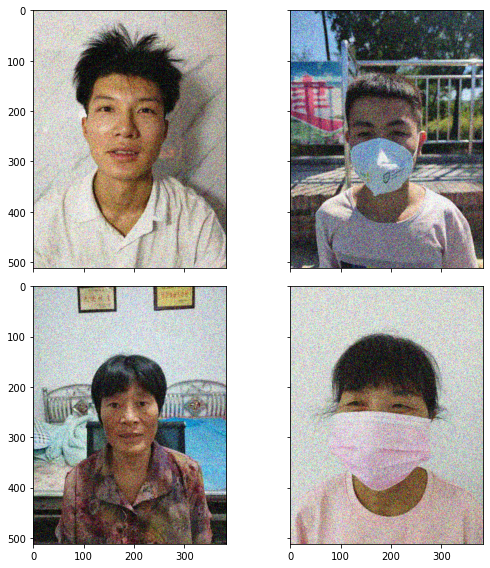

In [36]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([
            GaussNoise(var_limit=(1000, 1600), p=1.0),
        ], p=1.0)
random.shuffle(img_paths)

for i in range(n_rows*n_cols):
    _img = np.array(Image.open(img_paths[i]))
    axes[i%n_rows][i//n_cols].imshow(trfm(image=_img)['image'])

plt.tight_layout()

위에서 살펴본 모든 Augmentation 기법을 적용시킴

18900


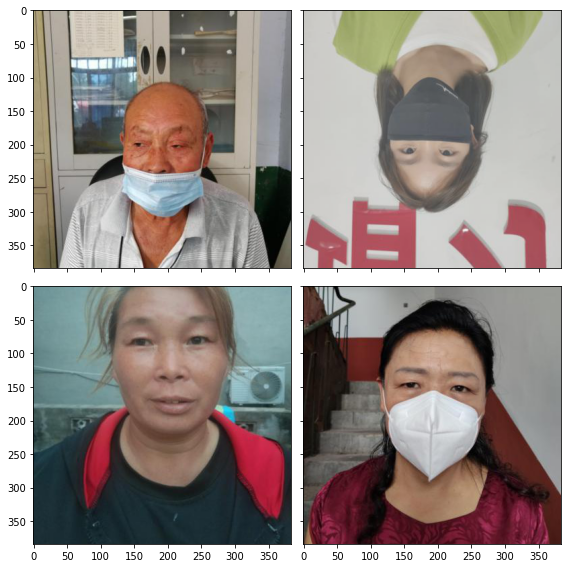

In [37]:
n_rows, n_cols = 2, 2
print(len(img_paths))
fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([
            RandomCrop(height=384, width=384, p=1.0),
            HorizontalFlip(p=0.5),
            VerticalFlip(p=0.5),
            RandomBrightnessContrast(brightness_limit=(-0.3, 0.3), contrast_limit=(-0.3, 0.3), p=0.5),
            GaussNoise(var_limit=(1000, 1600), p=0.3),
        ], p=1.0)
random.shuffle(img_paths)
for i in range(n_rows*n_cols):
    _img = np.array(Image.open(img_paths[i]))
    axes[i%n_rows][i//n_cols].imshow(trfm(image=_img)['image'])

plt.tight_layout()

위에서 살펴본 Augmentation 외에도 많은 방법이 존재합니다.
이 부분에서는 이미지에 대한 공간적인 변화없이, 픽셀 값 자체만 바꾸는 다양한 Pixel-level Transform을 시각화 해봅니다.

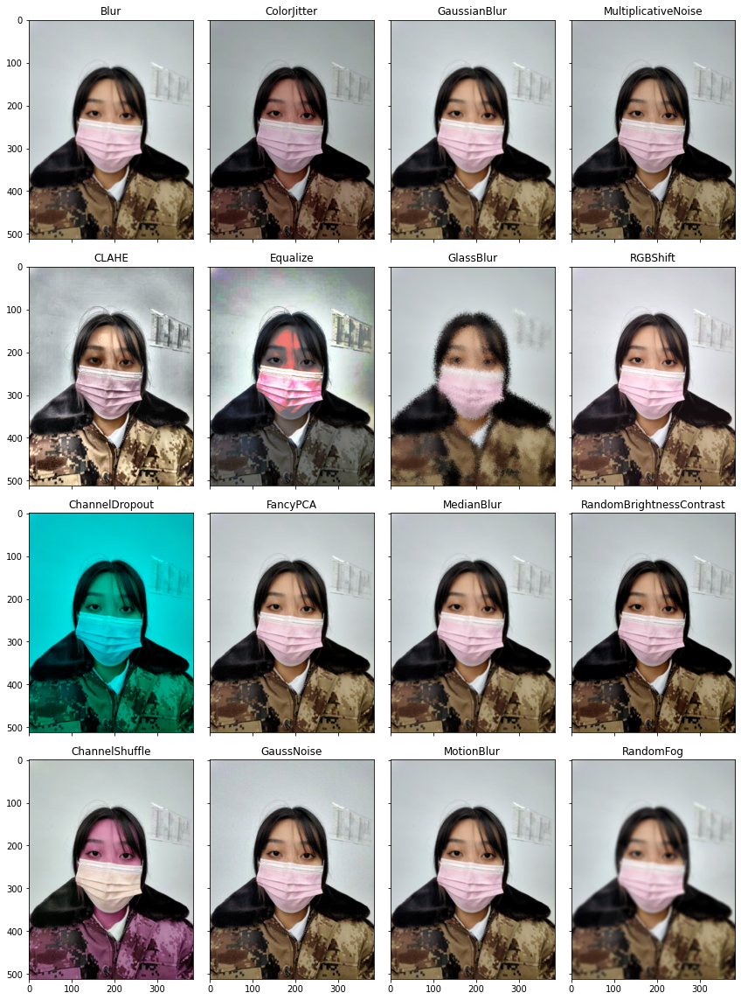

In [38]:
n_rows, n_cols = 4, 4

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(12, 16))

trfm_ls = [Blur,
           CLAHE,
           ChannelDropout,
           ChannelShuffle,
           ColorJitter,
           Equalize,
           FancyPCA,
           GaussNoise,
           GaussianBlur,
           GlassBlur,
           MedianBlur,
           MotionBlur,
           MultiplicativeNoise,
           RGBShift,
           RandomBrightnessContrast,
           RandomFog,
           Solarize]
for i in range(n_rows*n_cols):
    trfm = Compose([Resize(height=512, width=384, p=1.0), trfm_ls[i](p=1.0)])
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)['image'])
    axes[i%n_rows][i//n_cols].set_title(f'{trfm_ls[i].__name__}')

plt.tight_layout()

공간적으로 이미지를 변형

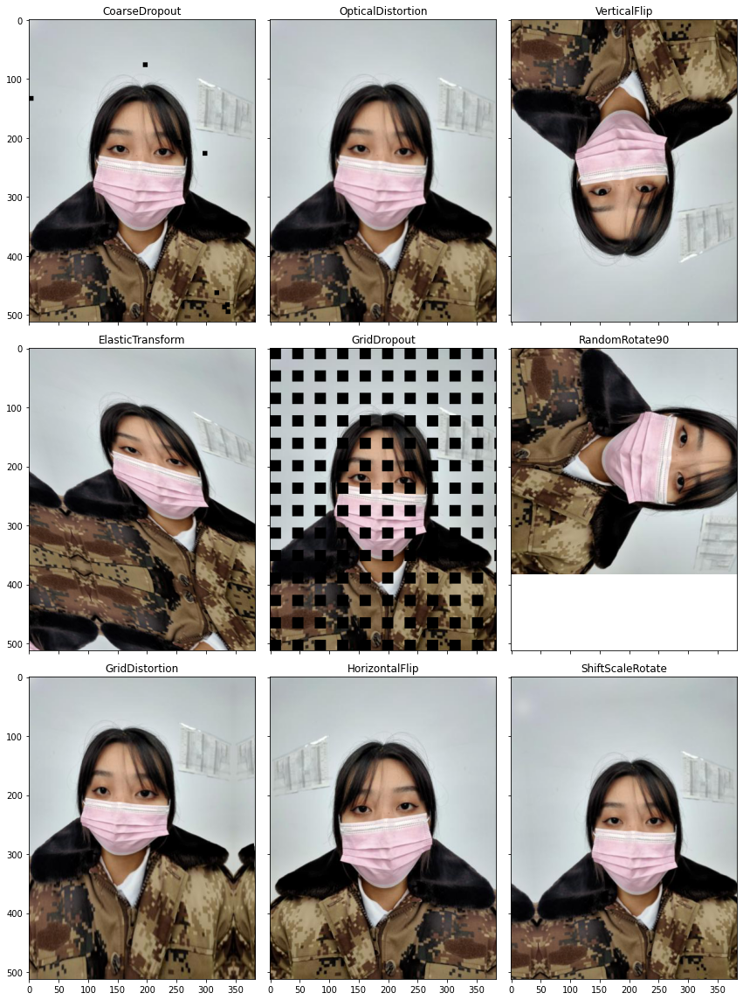

In [39]:
n_rows, n_cols = 3, 3

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(12, 16))

trfm_ls = [CoarseDropout,
           ElasticTransform,
           GridDistortion,
           OpticalDistortion,
           GridDropout,
           HorizontalFlip,
           VerticalFlip,
           RandomRotate90,
           ShiftScaleRotate]
for i in range(n_rows*n_cols):
    trfm = Compose([Resize(height=512, width=384, p=1.0), trfm_ls[i](p=1.0)])
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)['image'])
    axes[i%n_rows][i//n_cols].set_title(f'{trfm_ls[i].__name__}')

plt.tight_layout()

In [40]:
import os
import sys
from glob import glob
import numpy as np
import pandas as pd
import cv2
from PIL import Image
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from time import time

import torch
import torch.utils.data as data

import matplotlib.pyplot as plt
import seaborn as sns

In [41]:
data_dir

'input/data/train/images'

In [42]:
data_dir=data_dir.replace("/images","")

In [43]:
img_dir = f'{data_dir}/images'
df_path = f'{data_dir}/train.csv'

In [44]:
df = pd.read_csv(df_path)
df.head()

,id,gender,race,age,path
0,000001,female,Asian,45,000001_female_Asian_45
1,000002,female,Asian,52,000002_female_Asian_52
2,000004,male,Asian,54,000004_male_Asian_54
3,000005,female,Asian,58,000005_female_Asian_58
4,000006,female,Asian,59,000006_female_Asian_59


데이터셋의 RGB 평균, 표준편차를 구하는 함수를 이용하여 그에 대한 계산한다.

In [45]:
# 확장자 얻기
# def get_ext(img_dir, img_id):
#     filename = os.listdir(os.path.join(img_dir, img_id))[0]
#     ext = os.path.splitext(filename)[-1].lower()
#     return ext

# 이미지 스탯
# def get_img_stats(img_dir, img_ids):
#     img_info = dict(heights=[], widths=[], means=[], stds=[])
#     for img_id in tqdm(img_ids):
#         for path in glob(os.path.join(img_dir, img_id, '*')):
#             img = np.array(Image.open(path))
#             h, w, _ = img.shape
#             img_info['heights'].append(h)
#             img_info['widths'].append(w)
#             img_info['means'].append(img.mean(axis=(0,1)))
#             img_info['stds'].append(img.std(axis=(0,1)))
#     return img_info

# img_info = get_img_stats(img_dir, df.path.values)

# print(f'RGB Mean: {np.mean(img_info["means"], axis=0) / 255.}')
# print(f'RGB Standard Deviation: {np.mean(img_info["stds"], axis=0) / 255.}')

## 2.1 Augmentation Function
- 3강에서 배운 Augmentation 함수를 정의
- mean, std는 임의로 설정

In [46]:
mean, std = (0.5, 0.5, 0.5), (0.2, 0.2, 0.2)

### 2.1.2 Albumentation Style Augmentation Function
- Albumentation은 numpy 형식으로 이미지를 받아 데이터를 변형시킵니다.
- opencv 기반으로 빠르고, 다양한 Augmentation 방법이 제공되는 점에서 장점이 있습니다.

In [47]:
from albumentations import *
from albumentations.pytorch import ToTensorV2


def get_transforms(need=('train', 'val'), img_size=(512, 384), mean=(0.548, 0.504, 0.479), std=(0.237, 0.247, 0.246)):
    """
    train 혹은 validation의 augmentation 함수를 정의합니다. train은 데이터에 많은 변형을 주어야하지만, validation에는 최소한의 전처리만 주어져야합니다.
    
    Args:
        need: 'train', 혹은 'val' 혹은 둘 다에 대한 augmentation 함수를 얻을 건지에 대한 옵션입니다.
        img_size: Augmentation 이후 얻을 이미지 사이즈입니다.
        mean: 이미지를 Normalize할 때 사용될 RGB 평균값입니다.
        std: 이미지를 Normalize할 때 사용될 RGB 표준편차입니다.

    Returns:
        transformations: Augmentation 함수들이 저장된 dictionary 입니다. transformations['train']은 train 데이터에 대한 augmentation 함수가 있습니다.
    """
    transformations = {}
    if 'train' in need:
        transformations['train'] = Compose([
            Resize(img_size[0], img_size[1], p=1.0),
            HorizontalFlip(p=0.5),
            ShiftScaleRotate(p=0.5),
            HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),
            RandomBrightnessContrast(brightness_limit=(-0.1, 0.1), contrast_limit=(-0.1, 0.1), p=0.5),
            GaussNoise(p=0.5),
            Normalize(mean=mean, std=std, max_pixel_value=255.0, p=1.0),
            ToTensorV2(p=1.0),
        ], p=1.0)
    if 'val' in need:
        transformations['val'] = Compose([
            Resize(img_size[0], img_size[1]),
            Normalize(mean=mean, std=std, max_pixel_value=255.0, p=1.0),
            ToTensorV2(p=1.0),
        ], p=1.0)
    return transformations

In [48]:
# 마스크 여부
class MaskLabels:
    mask = 0
    incorrect = 1
    normal = 2

# 성별
class GenderLabels:
    male = 0
    female = 1

#나이
class AgeGroup:
    map_label = lambda x: 0 if int(x) < 30 else 1 if int(x) < 60 else 2

In [49]:
class MaskBaseDataset(data.Dataset):
    num_classes = 3*2*3
    
    _file_names ={
        "mask1.jpg": MaskLabels.mask,
        "mask2.jpg": MaskLabels.mask,
        "mask3.jpg": MaskLabels.mask,
        "mask4.jpg": MaskLabels.mask,
        "mask5.jpg": MaskLabels.mask,
        "incorrect_mask.jpg": MaskLabels.incorrect,
        "normal.jpg": MaskLabels.normal
    }
    
    image_paths = []
    mask_labels = []
    gender_labels = []
    age_labels = []
    
    ## 참고
    def __init__(self, img_dir, transform=None):
        """
        MaskBaseDataset을 initialize 합니다.

        Args:
            img_dir: 학습 이미지 폴더의 root directory 입니다.
            transform: Augmentation을 하는 함수입니다.
        """
        self.img_dir = img_dir
        self.mean = mean
        self.std = std
        self.transform = transform

        self.setup()

    def set_transform(self, transform):
        """
        transform 함수를 설정하는 함수입니다.
        """
        self.transform = transform
        
    def setup(self):
        """
        image의 경로와 각 이미지들의 label을 계산하여 저장해두는 함수입니다.
        """
        profiles = os.listdir(self.img_dir)
        for profile in profiles:
            for file_name, label in self._file_names.items():
                img_path = os.path.join(self.img_dir, profile, file_name)  # (resized_data, 000004_male_Asian_54, mask1.jpg)
                if os.path.exists(img_path):
                    self.image_paths.append(img_path)
                    self.mask_labels.append(label)

                    id, gender, race, age = profile.split("_")
                    gender_label = getattr(GenderLabels, gender)
                    age_label = AgeGroup.map_label(age)

                    self.gender_labels.append(gender_label)
                    self.age_labels.append(age_label)

    def __getitem__(self, index):
        """
        데이터를 불러오는 함수입니다. 
        데이터셋 class에 데이터 정보가 저장되어 있고, index를 통해 해당 위치에 있는 데이터 정보를 불러옵니다.
        
        Args:
            index: 불러올 데이터의 인덱스값입니다.
        """
        # 이미지를 불러옵니다.
        image_path = self.image_paths[index]
        image = Image.open(image_path)
        
        # 레이블을 불러옵니다.
        mask_label = self.mask_labels[index]
        gender_label = self.gender_labels[index]
        age_label = self.age_labels[index]
        multi_class_label = mask_label * 6 + gender_label * 3 + age_label
        
        # 이미지를 Augmentation 시킵니다.
        image_transform = self.transform(image=np.array(image))['image']
        return image_transform, multi_class_label

    def __len__(self):
        return len(self.image_paths)

In [50]:
# 정의한 Augmentation 함수와 Dataset 클래스 객체를 생성합니다.
transform = get_transforms(mean=mean, std=std)

dataset = MaskBaseDataset(
    img_dir=img_dir
)

# train dataset과 validation dataset을 8:2 비율로 나눕니다.
n_val = int(len(dataset) * 0.2)
n_train = len(dataset) - n_val
train_dataset, val_dataset = data.random_split(dataset, [n_train, n_val])

# 각 dataset에 augmentation 함수를 설정합니다.
train_dataset.dataset.set_transform(transform['train'])
val_dataset.dataset.set_transform(transform['val'])

## DataLoader
- 정의한 Dataset을 바탕으로 DataLoader을 생성합니다.
- Dataset은 이미지 한장을 주는 모듈이라면, DataLoader은 여러 이미지를 batch_size만큼 묶어 전달해줍니다.

In [51]:
# training dataloader은 데이터를 섞어주어야 합니다. (shuffle=True)
train_loader = data.DataLoader(
    train_dataset,
    batch_size=16,
    num_workers=4,
    shuffle=True
)
print(train_loader)
val_loader = data.DataLoader(
    val_dataset,
    batch_size=16,
    num_workers=4,
    shuffle=False
)
print(val_loader)

## Visualize Processed Data
- 파트 4에선 정의한 DataLoader을 이용하여 데이터가 어떻게 전처리 되었는지 시각화하여 확인합니다.

images shape: torch.Size([16, 3, 512, 384])
labels shape: torch.Size([16])


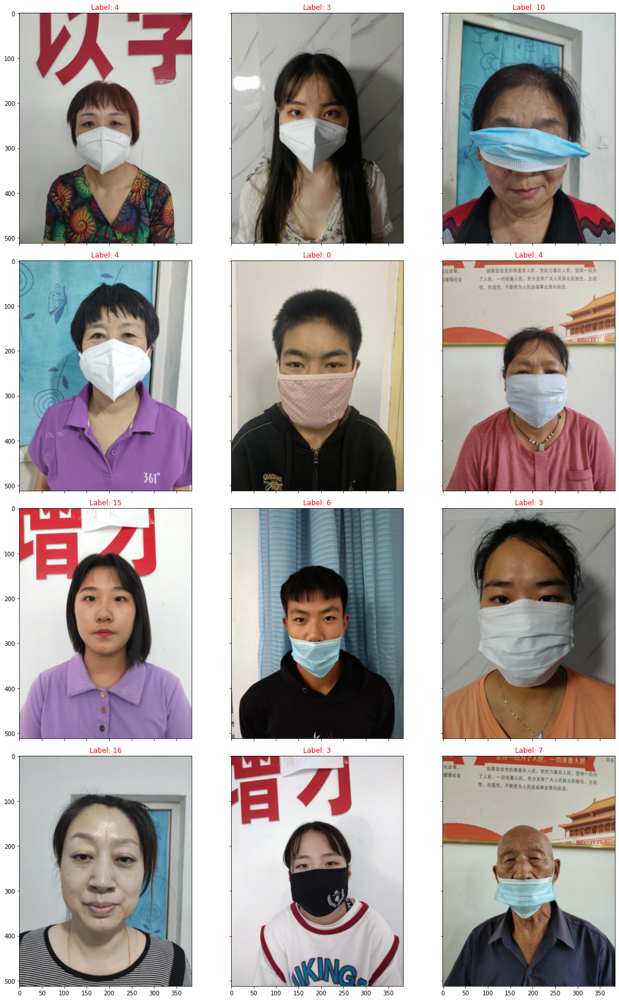

In [52]:
images, labels = next(iter(train_loader))
print(f'images shape: {images.shape}')
print(f'labels shape: {labels.shape}')

from torchvision import transforms

# Augmentation으로 이미지를 Normalize했기 때문에, 역으로 다시 Normalize 해주어야합니다.
inv_normalize = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean, std)],
    std=[1 / s for s in std]
)

n_rows, n_cols = 4, 3

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(16, 24))
for i in range(n_rows*n_cols):
    axes[i%n_rows][i//(n_cols+1)].imshow(inv_normalize(images[i]).permute(1, 2, 0))
    axes[i%n_rows][i//(n_cols+1)].set_title(f'Label: {labels[i]}', color='r')
plt.tight_layout()

## 모델 구성

In [53]:
from pprint import pprint

import torch
import torch.nn as nn
import torch.nn.functional as F

In [54]:
class Model(nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=3, kernel_size=3, bias=True)
        self.bn1 = nn.BatchNorm2d(num_features=3)
        self.conv2 = nn.Conv2d(in_channels=3, out_channels=5, kernel_size=3, bias=False)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        return F.relu(self.conv2(x))

### 모델 디버깅
 - 파이토치 모델들은 다음과 같읕 방법들을 통해 파라미터를 눈으로 확인할 수 있다.

In [55]:
model = Model()
model

# 1. using named_parameters()
for param, weight in model.named_parameters():
    print(f"{param:20} - size: {weight.size()}")
    print(weight)
    print("-" * 100)
    print()

conv1.weight         - size: torch.Size([3, 1, 3, 3])
Parameter containing:
tensor([[[[ 0.1908, -0.0398,  0.1721],
          [-0.1933,  0.1709, -0.1688],
          [ 0.0065,  0.0890,  0.0358]]],


        [[[-0.0908, -0.1170, -0.2123],
          [-0.1678,  0.1717, -0.3050],
          [ 0.2168, -0.0083, -0.1994]]],


        [[[-0.2426,  0.2194,  0.1728],
          [ 0.0691,  0.1513,  0.1049],
          [ 0.2541, -0.1441,  0.2864]]]], requires_grad=True)
----------------------------------------------------------------------------------------------------

conv1.bias           - size: torch.Size([3])
Parameter containing:
tensor([ 0.1831, -0.0839, -0.1037], requires_grad=True)
----------------------------------------------------------------------------------------------------

bn1.weight           - size: torch.Size([3])
Parameter containing:
tensor([1., 1., 1.], requires_grad=True)
----------------------------------------------------------------------------------------------------

bn1.b

In [56]:
# 2. directly access with member variable
print(model.conv1.weight)
print(model.conv1.bias)

Parameter containing:
tensor([[[[ 0.1908, -0.0398,  0.1721],
          [-0.1933,  0.1709, -0.1688],
          [ 0.0065,  0.0890,  0.0358]]],


        [[[-0.0908, -0.1170, -0.2123],
          [-0.1678,  0.1717, -0.3050],
          [ 0.2168, -0.0083, -0.1994]]],


        [[[-0.2426,  0.2194,  0.1728],
          [ 0.0691,  0.1513,  0.1049],
          [ 0.2541, -0.1441,  0.2864]]]], requires_grad=True)
Parameter containing:
tensor([ 0.1831, -0.0839, -0.1037], requires_grad=True)


### 학습된 모델 저장하기
 - `torch.save(model.state_dict(), save_path)`

In [57]:
import os

save_folder = "./runs/"
save_path = os.path.join(save_folder, "best.pth")   # ./runs/best.pth
os.makedirs(save_folder, exist_ok=True)  

torch.save(model.state_dict(), save_path)
print(f"Model saving success at {save_path}")
print(f"Saved models : {os.listdir(save_folder)}")

Model saving success at ./runs/best.pth
Saved models : ['**', 'fashion_mnist_experiment_1', 'best.pth']


In [58]:
# 저장된 모델 불러오기
new_model = Model()
new_model.load_state_dict(torch.load(save_path))
print(f"Model loading success from {save_path}")

Model loading success from ./runs/best.pth


In [59]:
for (name, trained_weight), (_, saved_weight) in zip(model.named_parameters(), new_model.named_parameters()):
    is_equal = torch.equal(trained_weight, saved_weight)
    print(f"parameter {name:15} from trained model and loaded model is equal? -> {is_equal}")

parameter conv1.weight    from trained model and loaded model is equal? -> True
parameter conv1.bias      from trained model and loaded model is equal? -> True
parameter bn1.weight      from trained model and loaded model is equal? -> True
parameter bn1.bias        from trained model and loaded model is equal? -> True
parameter conv2.weight    from trained model and loaded model is equal? -> True


#### state_dict() 이란?
 - 모델의 저장과 로딩에 사용
 - 기본적으로 위에서 살펴본 `.named_parameters()` 와 매우 유사합니다
 - model parameter 를 Key 로 가지고, model weights 를 Value 로 가지는 파이썬 딕셔너리일 뿐입니다. 
   (정확한 Type 은 파이썬 내장 라이브러리 collections.OrderDict 입니다)

In [60]:
for param, weight in model.state_dict().items():
    print(f"{param:20} - size: {weight.size()}")
    print(weight)
    print("-" * 100)

conv1.weight         - size: torch.Size([3, 1, 3, 3])
tensor([[[[ 0.1908, -0.0398,  0.1721],
          [-0.1933,  0.1709, -0.1688],
          [ 0.0065,  0.0890,  0.0358]]],


        [[[-0.0908, -0.1170, -0.2123],
          [-0.1678,  0.1717, -0.3050],
          [ 0.2168, -0.0083, -0.1994]]],


        [[[-0.2426,  0.2194,  0.1728],
          [ 0.0691,  0.1513,  0.1049],
          [ 0.2541, -0.1441,  0.2864]]]])
----------------------------------------------------------------------------------------------------
conv1.bias           - size: torch.Size([3])
tensor([ 0.1831, -0.0839, -0.1037])
----------------------------------------------------------------------------------------------------
bn1.weight           - size: torch.Size([3])
tensor([1., 1., 1.])
----------------------------------------------------------------------------------------------------
bn1.bias             - size: torch.Size([3])
tensor([0., 0., 0.])
--------------------------------------------------------------------

In [61]:
from collections import OrderedDict
print(f"model.state_dict() type is : {type(model.state_dict())}")
type(model.state_dict()) == OrderedDict

model.state_dict() type is : <class 'collections.OrderedDict'>


True

#### `named_parameters()` 을 안쓰고 `state_dict()` 을 사용하는 이유
 - `named_parameters()` : returns only parameters
 - `state_dict()`: returns both parameters and buffers (e.g. BN runnin_mean, running_var)
 
 [Reference](https://stackoverflow.com/a/54747245)

In [62]:
pprint([name for (name, param) in model.named_parameters()])  # named_parameters() : returns only parameters
print()
pprint(list(model.state_dict().keys()))  # state_dict(): retuns both parameters and buffers

['conv1.weight', 'conv1.bias', 'bn1.weight', 'bn1.bias', 'conv2.weight']

['conv1.weight',
 'conv1.bias',
 'bn1.weight',
 'bn1.bias',
 'bn1.running_mean',
 'bn1.running_var',
 'bn1.num_batches_tracked',
 'conv2.weight']


In [63]:
# model.cpu()
# for weight in model.parameters():
#     print(f"model device: {weight.device}")

In [64]:
# cuda()
# Moves all model parameters and buffers to the GPU.

model.cuda()
for weight in model.parameters():
    print(f"model device: {weight.device}")

model device: cuda:0
model device: cuda:0
model device: cuda:0
model device: cuda:0
model device: cuda:0


In [65]:
# to()
# Moves and/or casts the parameters and buffers

device_options = ['cpu', 'cuda']
for device_option in device_options:
    device = torch.device(device_option)
    model.to(device)
    
    print(f"Set model device to {device_option}")
    for weight in model.parameters():
        print(f"model device: {weight.device}")
    print()

Set model device to cpu
model device: cpu
model device: cpu
model device: cpu
model device: cpu
model device: cpu

Set model device to cuda
model device: cuda:0
model device: cuda:0
model device: cuda:0
model device: cuda:0
model device: cuda:0



### forward
 - nn.Module 을 상속한 객체를 직접 호출할 때 수행하는 연산을 정의합니다.
 - `model(input)` 을 통해 모델의 예측값을 계산할 수 있습니다.
 - Defines the computation performed at every call

In [66]:
dummy_input = torch.randn(1, 1, 12, 12).to(device)
model.to(device)
output = model(dummy_input)
print(f"model output: {output.size()}")
output

model output: torch.Size([1, 5, 8, 8])


tensor([[[[0.0794, 0.2645, 0.5145, 0.3705, 0.7555, 0.0611, 0.6494, 0.5104],
          [0.6015, 0.2522, 0.4210, 0.8412, 0.1681, 0.1021, 0.4418, 0.2055],
          [0.3703, 0.2936, 0.2702, 0.6020, 0.2474, 0.6097, 0.8341, 0.6661],
          [0.2361, 0.0995, 0.4804, 0.4418, 0.0000, 0.1135, 0.2384, 0.1535],
          [0.4165, 0.3268, 0.0000, 0.0927, 0.1387, 0.0910, 0.5560, 0.1720],
          [0.1682, 0.0000, 0.4736, 0.8489, 1.2055, 0.6186, 0.0000, 0.3165],
          [0.0000, 0.2431, 0.2598, 0.8868, 0.0000, 0.0575, 0.4462, 0.4647],
          [0.0000, 0.7885, 0.6907, 0.2372, 0.5963, 0.9328, 1.2226, 0.1585]],

         [[0.0000, 0.4609, 0.0000, 0.5080, 0.4828, 0.1003, 0.0771, 0.1785],
          [0.2168, 0.0000, 0.0000, 0.3213, 0.0000, 0.2823, 0.4760, 0.5084],
          [0.0000, 0.0000, 0.5144, 0.0000, 0.0000, 0.1277, 0.0000, 0.1236],
          [0.0000, 0.8447, 0.0000, 0.0000, 0.2510, 0.2140, 0.0000, 0.4445],
          [0.0000, 0.0107, 0.2053, 0.3410, 0.4904, 0.0000, 0.3136, 0.0000],
          

#### Cautions
 - 모델과 인풋의 device 는 반드시 같아야 합니다.
 - 그렇지 않으면 (Runtime) Error 가 발생합니다.

In [67]:
cpu_device = torch.device('cpu')
gpu_device = torch.device('cuda')

# device is same
dummy_input = dummy_input.to(gpu_device)
model.to(gpu_device)
output = model(dummy_input)  # Fine 
print(f"model output: {output.size()}")

model output: torch.Size([1, 5, 8, 8])


In [68]:
# dummy_input = dummy_input.to(cpu_device)
# model.to(gpu_device)

# device is different
# RuntimeError: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same
# output = model(dummy_input)  # raise Error
# print(f"model output: {output.size()}")

### requires_grad()
 - autograd 가 해당 모델의 연산을 기록할지를 결정합니다
 - false 일 시, 수행하는 연산을 기록하지 않고 따라서 역전파가 되지 않아 학습에서 제외됩니다.
 - Change if autograd should record operations on parameters in this module.

In [69]:
# requires_grad = False
# model.requires_grad_(requires_grad=False)
# for param, weight in model.named_parameters():
#     print(f"param {param:15} required gradient? -> {weight.requires_grad}")
    
# print("=========================")

# requires_grad = True
model.requires_grad_(requires_grad=True)
for param, weight in model.named_parameters():
    print(f"param {param:15} required gradient? -> {weight.requires_grad}")

param conv1.weight    required gradient? -> True
param conv1.bias      required gradient? -> True
param bn1.weight      required gradient? -> True
param bn1.bias        required gradient? -> True
param conv2.weight    required gradient? -> True


### train(), eval()
 - 모델을 training(evaluation) 모드로 전환합니다.
 - training 과 evaluation 이 다르게 작용하는 모듈들(Dropout, BatchNorm) 에 영향을 줍니다.
 - 학습 단계에서는 training 모드로, 인퍼런스 단계에서는 eval 모드로 전환해주어야 합니다.
 - [아래](https://github.com/pytorch/pytorch/blob/master/torch/nn/modules/batchnorm.py#L111-L118)는 BatchNorm2d 의 파이토치 구현입니다. `self.training=True` 일 경우에만, `running_mean`, `running_var` 을 tracking 합니다.
 
```
if self.training and self.track_running_stats:
    # TODO: if statement only here to tell the jit to skip emitting this when it is None
    if self.num_batches_tracked is not None:
        self.num_batches_tracked = self.num_batches_tracked + 1
        if self.momentum is None:  # use cumulative moving average
            exponential_average_factor = 1.0 / float(self.num_batches_tracked)
        else:  # use exponential moving average
            exponential_average_factor = self.momentum
```

In [70]:
model.train()  # set model to train mode
print(f"model.bn1.training: {model.bn1.training}")

model.bn1.training: True


In [71]:
model.eval()  # set model to eval mode
print(f"model.bn1.training: {model.bn1.training}")

model.bn1.training: False


## Pretrained Model
 - 이번 실습 자료에서는 강의시간에 다루었던 torchvision 을 사용하여 pretrained 모델을 사용하는 방법에 대해 실습하겠습니다.
 - torchvision 의 pretrained model 리스트는 다음과 같습니다
 
 [List of torchvision models](https://github.com/pytorch/vision/blob/master/torchvision/models/__init__.py#L1-L14)
```
from .alexnet import *
from .resnet import *
from .vgg import *
from .squeezenet import *
from .inception import *
from .densenet import *
from .googlenet import *
from .mobilenet import *
from .mnasnet import *
from .shufflenetv2 import *
from . import segmentation
from . import detection
from . import video
from . import quantization
```

In [72]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

In [73]:
# alexnet
from torchvision.models import alexnet
model = alexnet()
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [74]:
# alexnet의 pretrained 버전을 불러오기
model = alexnet(pretrained=True)
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

#### torchvision 에서 해당 모델을 어떤 식으로 구현하였는지 직접 확인해보면 매우 도움이 많으 됩니다.
Example:
[source code](https://github.com/pytorch/vision/blob/master/torchvision/models/alexnet.py#L15-L50)
```
class AlexNet(nn.Module):

    def __init__(self, num_classes=1000):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x
```

#### 다른 모델들( e.g. vgg19, resnet18) 도 같은 방법으로 손 쉽게 사용할 수 있다.

In [75]:
from torchvision.models import vgg19_bn
model = vgg19_bn(pretrained=True)
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

#### Pretrained 모델을 내 태스크에 맞게 어떻게 사용할 수 있나요?
 - Trochvision 모델들은 보통 feature-extraction 파트, task-specific 파트로 크게 두 가지로 구성되어 있습니다.
 - Task specific 파트는 모델의 태스크(이미지 분류, 객체 인식 등) 에 따라 모두 다릅니다.
 - 심지어 같은 이미지 분류 안에서도, 어떤 데이터셋으로 pretrain 하였느냐에 따라 다를 수 있습니다.
 - 따라서, 우리도 우리 테스크에 맞게 task specific 파트는 새로 정의하여 사용하여야 합니다.

 - 주로 이미지넷 데이터셋을 사용하여 pretrain 을 하기에 output_dim=1000 인 경우가 많습니다.
 - 따라서 우리 태스크의 클래스 갯수(18)에 맞게 재정의하여 사용할 수 있습니다.

In [76]:
num_classes = 18
model = vgg19_bn(pretrained=True)
model.classifier = nn.Sequential(
    nn.Linear(512 * 7 * 7, 4096),
    nn.ReLU(True),
    nn.Dropout(),
    nn.Linear(4096, 4096),
    nn.ReLU(True),
    nn.Dropout(),
    nn.Linear(4096, num_classes),
)

model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

#### Weight Freeze
 - Weight freeze 란 해당 모듈의 graident 는 역전파 하지 않아 학습을 하지 않는다는 의미입니다.
 - 예를 들어, 우리가 하려는 태스크가 pretrain 한 태스크와 매우 유사하다면, feature 파트는 freeze 하여 학습하지 않고 새로 정의한 task specific 파트만 학습하는 것이 좋은 방법일 수 있습니다.
 - weight freeze 는 `requires_grad` 를 사용하여 쉽게 구현할 수 있습니다. 

In [77]:
# Freeze only feauture parts
model.features.requires_grad_(False)
for param, weight in model.named_parameters():
    print(f"param {param:20} required gradient? -> {weight.requires_grad}")

param features.0.weight    required gradient? -> False
param features.0.bias      required gradient? -> False
param features.1.weight    required gradient? -> False
param features.1.bias      required gradient? -> False
param features.3.weight    required gradient? -> False
param features.3.bias      required gradient? -> False
param features.4.weight    required gradient? -> False
param features.4.bias      required gradient? -> False
param features.7.weight    required gradient? -> False
param features.7.bias      required gradient? -> False
param features.8.weight    required gradient? -> False
param features.8.bias      required gradient? -> False
param features.10.weight   required gradient? -> False
param features.10.bias     required gradient? -> False
param features.11.weight   required gradient? -> False
param features.11.bias     required gradient? -> False
param features.14.weight   required gradient? -> False
param features.14.bias     required gradient? -> False
param feat

#### Weight initialization 
 - weight 초기화는 종종 모델의 성능에 critical 한 영향을 줍니다.
 - 하지만 만약 pretrained 모델을 사용한다면 pretrained 부분은 초기화를 하지 말고, 재정의한 task specific 파트만 초기화하여야 합니다.

In [78]:
import torch.nn.init as init

def initialize_weights(model):
    """
    Initialize all weights using xavier uniform. 
    For more weight initialization methods, check https://pytorch.org/docs/stable/nn.init.html
    """
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            init.xavier_uniform_(m.weight.data)
            if m.bias is not None:
                m.bias.data.zero_()
        elif isinstance(m, nn.BatchNorm2d):
            m.weight.data.fill_(1)
            m.bias.data.zero_()
        elif isinstance(m, nn.Linear):
            m.weight.data.normal_(0, 0.01)
            m.bias.data.zero_()

(array([1.00e+00, 0.00e+00, 1.00e+01, 3.50e+01, 1.58e+02, 1.47e+03,
        4.00e+01, 1.30e+01, 0.00e+00, 1.00e+00]),
 array([-1.644177  , -1.3200787 , -0.99598044, -0.67188215, -0.3477839 ,
        -0.02368563,  0.30041263,  0.6245109 ,  0.9486092 ,  1.2727075 ,
         1.5968057 ], dtype=float32),
 <a list of 10 Patch objects>)

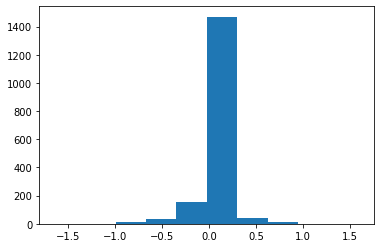

In [79]:
# pretrained된 모델 분포
import matplotlib.pyplot as plt

model = vgg19_bn(pretrained=True)

# Before initialize weights
plt.hist(model.features[0].weight.detach().numpy().reshape(-1))  # weight distribution for first conv weight

#### weight 초기화 후 분포를 봐 봅시다
 - `xavier_uniform` 으로 초기화하여 웨이트들이 uniform 한 분포를 가지게 되었습니다.

(array([177., 179., 176., 184., 173., 168., 183., 166., 165., 157.]),
 array([-9.9719577e-02, -7.9772718e-02, -5.9825864e-02, -3.9879009e-02,
        -1.9932153e-02,  1.4703721e-05,  1.9961560e-02,  3.9908417e-02,
         5.9855271e-02,  7.9802126e-02,  9.9748984e-02], dtype=float32),
 <a list of 10 Patch objects>)

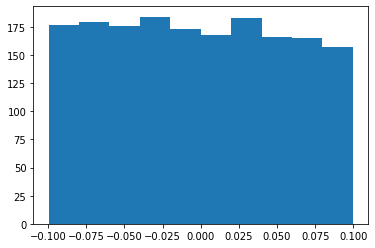

In [80]:
model = vgg19_bn(pretrained=True)

# Initalize all weights
initialize_weights(model.features)

# After initialize weights
plt.hist(model.features[0].weight.detach().numpy().reshape(-1))

#### task specific 한 부분만 초기화하엿습니다
 - feature extraction 파트는 초기화가 되지 않은 것은 확인할 수 있습니다.

(array([1.00e+00, 0.00e+00, 1.00e+01, 3.50e+01, 1.58e+02, 1.47e+03,
        4.00e+01, 1.30e+01, 0.00e+00, 1.00e+00]),
 array([-1.644177  , -1.3200787 , -0.99598044, -0.67188215, -0.3477839 ,
        -0.02368563,  0.30041263,  0.6245109 ,  0.9486092 ,  1.2727075 ,
         1.5968057 ], dtype=float32),
 <a list of 10 Patch objects>)

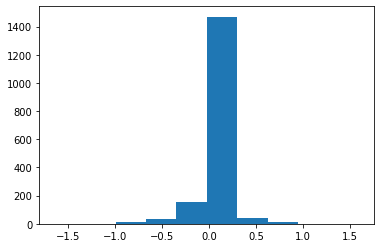

In [81]:
model = vgg19_bn(pretrained=True)

# Initialize only classifier part
initialize_weights(model.classifier)

# After initialize weights
plt.hist(model.features[0].weight.detach().numpy().reshape(-1))  # weight distribution for first conv weight

## Training, Inference

In [82]:
import random
import os, sys
from importlib import import_module

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Subset
from torch.optim import SGD, Adam, AdamW
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR

sys.path.append(os.path.abspath('..'))
# from dataset import MaskBaseDataset
# from model import *

sys.path.append('../')
# import dataset
# from dataset import MaskMultiClassDataset

def seed_everything(seed):
    """
    동일한 조건으로 학습을 할 때, 동일한 결과를 얻기 위해 seed를 고정시킵니다.
    
    Args:
        seed: seed 정수값
    """
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)
seed_everything(38)

In [83]:
data_dir

'input/data/train'

In [84]:
# -- parameters

img_root = data_dir+'/images'  # 학습 이미지 폴더의 경로
label_path = data_dir+'/train.csv'  # 학습 메타파일의 경로

model_name = "VGG19"  # 모델 이름
use_pretrained = True  # pretrained-model의 사용 여부
freeze_backbone = False  # classifier head 이 외 부분을 업데이트되지 않게 할 것인지 여부

val_split = 0.3  # validation dataset의 비율
batch_size = 16
# batch_size = 16
num_workers = 4
num_classes = 18

num_epochs = 6  # 학습할 epoch의 수
lr = 1e-5
# lr = 1e-4
lr_decay_step = 10

train_log_interval = 20  # logging할 iteration의 주기
name = "02_vgg"  # 결과를 저장하는 폴더의 이름

# -- settings
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

## 1. Loss
- Image Classification에 사용되는 다양한 loss 함수들이 존재합니다. 각 loss 함수는 목적이 있고 풀고자 하는 문제에 맞게 적용을 해야합니다.
- Cross Entropy Loss는 두 분포간의 불확실성을 최소화 하는 목적을 가진 분류에 사용되는 일반적인 손실함수입니다.
- Focal Loss는 Imbalanced Data 문제를 해결하기 위한 손실함수입니다. [참고](https://arxiv.org/pdf/1708.02002.pdf)
- Label Smoothing은 학습 데이터의 representation을 더 잘나타내는데 도움을 줍니다. [참고](https://arxiv.org/pdf/1906.02629.pdf)
- F1 Loss는 F1 score 향상을 목적으로 하는 손실함수입니다.

In [85]:
# -- Cross Entropy Loss
class CrossEntropyLoss(nn.Module):
    def __init__(self, weight=None, reduction='mean'):
        nn.Module.__init__(self)
        self.weight = weight
        self.reduction = reduction

    def forward(self, input_tensor, target_tensor):
        log_prob = F.log_softmax(input_tensor, dim=-1)
        prob = torch.exp(log_prob)
        return F.nll_loss(
            log_prob,
            target_tensor,
            weight=self.weight,
            reduction=self.reduction
        )
# -- Focal Loss
# https://discuss.pytorch.org/t/is-this-a-correct-implementation-for-focal-loss-in-pytorch/43327/8
class FocalLoss(nn.Module):
    def __init__(self, weight=None,
                 gamma=2., reduction='mean'):
        nn.Module.__init__(self)
        self.weight = weight
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, input_tensor, target_tensor):
        log_prob = F.log_softmax(input_tensor, dim=-1)
        prob = torch.exp(log_prob)
        return F.nll_loss(
            ((1 - prob) ** self.gamma) * log_prob,
            target_tensor,
            weight=self.weight,
            reduction=self.reduction
        )
# -- Label Smoothing Loss
class LabelSmoothingLoss(nn.Module):
    def __init__(self, classes=3, smoothing=0.0, dim=-1):
        super(LabelSmoothingLoss, self).__init__()
        self.confidence = 1.0 - smoothing
        self.smoothing = smoothing
        self.cls = classes
        self.dim = dim

    def forward(self, pred, target):
        pred = pred.log_softmax(dim=self.dim)
        with torch.no_grad():
            true_dist = torch.zeros_like(pred)
            true_dist.fill_(self.smoothing / (self.cls - 1))
            true_dist.scatter_(1, target.data.unsqueeze(1), self.confidence)
        return torch.mean(torch.sum(-true_dist * pred, dim=self.dim))
# -- F1 Loss
# https://gist.github.com/SuperShinyEyes/dcc68a08ff8b615442e3bc6a9b55a354
class F1Loss(nn.Module):
    def __init__(self, classes=3, epsilon=1e-7):
        super().__init__()
        self.classes = classes
        self.epsilon = epsilon
    def forward(self, y_pred, y_true):
        assert y_pred.ndim == 2
        assert y_true.ndim == 1
        y_true = F.one_hot(y_true, self.classes).to(torch.float32)
        y_pred = F.softmax(y_pred, dim=1)

        tp = (y_true * y_pred).sum(dim=0).to(torch.float32)
        tn = ((1 - y_true) * (1 - y_pred)).sum(dim=0).to(torch.float32)
        fp = ((1 - y_true) * y_pred).sum(dim=0).to(torch.float32)
        fn = (y_true * (1 - y_pred)).sum(dim=0).to(torch.float32)

        precision = tp / (tp + fp + self.epsilon)
        recall = tp / (tp + fn + self.epsilon)

        f1 = 2 * (precision * recall) / (precision + recall + self.epsilon)
        f1 = f1.clamp(min=self.epsilon, max=1 - self.epsilon)
        return 1 - f1.mean()

In [86]:
criterion = CrossEntropyLoss()

## 2. Optimizer
- 파이토치는 코드를 간단히 수정하여 다양한 optimizer를 사용할 수 있습니다.
- 또한 Model의 레이어마다 다른 learning rate를 적용할 수도 있습니다.

In [87]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [88]:
!pip install Adamp

# getattr(model,'classifier')

In [89]:
# -- model
# from model import *

# model_cls = getattr(import_module("model"), model_name)
# model_cls=getattr(model,model_name)
# print(model_cls)
model_cls=model
# model = model_cls(
#     num_classes=num_classes,
#     pretrained=use_pretrained,
#     freeze=freeze_backbone
# ).to(device)
model = model_cls.to(device)

In [90]:
# -- SGD optimizer
optimizer = SGD(model.parameters(), lr=lr, weight_decay=5e-4)

In [91]:
# -- Adam optimizer
from adamp import AdamP
optimizer = AdamP(model.parameters(), lr=lr, weight_decay=5e-4)

In [92]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [93]:
# -- optimizer: Different Learning Rates on different layers

# features 레이어와 classifier 레이어에서 서로 다른 learning rate를 적용하여 optimizer를 정의할 수 있습니다.
# train_params = [{'params': getattr(model.net, 'features').parameters(), 'lr': lr / 10, 'weight_decay':5e-4},
#                 {'params': getattr(model.net, 'classifier').parameters(), 'lr': lr, 'weight_decay':5e-4}]
# optimizer = Adam(train_params)

## Scheduler
- Scheduler은 optimizer의 learning rate를 동적으로 변경시키는 기능을 합니다.
- Optimizer과 Scheduler를 적절히 활용하면 모델이 좋은 성능으로 Fitting하는데 도움을 줍니다.

In [94]:
# -- scheduler: StepLR
# 지정된 step마다 learning rate를 감소시킵니다.
scheduler = StepLR(optimizer, lr_decay_step, gamma=0.5)

In [95]:
# -- scheduler: ReduceLROnPlateau
# 성능이 향상되지 않을 때 learning rate를 줄입니다. patience=10은 10회 동안 성능 향상이 없을 경우입니다.
scheduler = ReduceLROnPlateau(optimizer, factor=0.1, patience=10)

In [96]:
# -- scheduler: CosineAnnealingLR
# CosineAnnealing은 learning rate를 cosine 그래프처럼 변화시킵니다.
scheduler = CosineAnnealingLR(optimizer, T_max=2, eta_min=0.)

## Metric
- Classification 성능을 표현할 때 다양한 평가지표가 있습니다.
- Accuracy: 모델이 정확하게 예측한 객체의 비율
- True Positive(TP): 실제 True인 정답을 True라고 예측 (정답)
- False Positive(FP): 실제 False인 정답을 True라고 예측 (오답)
- False Negative(FN): 실제 True인 정답을 False라고 예측 (오답)
- True Negative(TN): 실제 False인 정답을 False라고 예측 (정답)
- Precision(정밀도): TP / (TP + FP)
- Recall(재현율): TP / (TP + FN)

In [97]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

y_true = [0, 1, 2, 0, 1, 2]
y_pred = [0, 2, 1, 0, 0, 1]

In [98]:
# -- Accuracy
accuracy_score(y_true, y_pred)

0.3333333333333333

In [99]:
# -- Accuracy
# Normalize를 안하면 맞춘 개수가 표시된다
accuracy_score(y_true, y_pred, normalize=False)

2

In [100]:
# -- Precision
precision = precision_score(y_true, y_pred, average='macro')
precision

0.2222222222222222

In [101]:
# -- Recall
recall = recall_score(y_true, y_pred, average='macro')
recall

0.3333333333333333

In [102]:
# -- f1 score
2 * (precision * recall) / (precision + recall)

0.26666666666666666

In [103]:
# -- f1 score (sklearn)
f1_score(y_true, y_pred, average='macro')

0.26666666666666666

## Training process

In [104]:
print(img_root,label_path)

input/data/train/images input/data/train/train.csv


In [105]:
dataset
len(dataset)

18035

In [106]:
# dataset = MaskMultiClassDataset(img_root, label_path, 'train')
n_val = int(len(dataset) * val_split)
n_train = len(dataset) - n_val
train_set, val_set = torch.utils.data.random_split(dataset, [n_train, n_val])
# val_set.dataset.set_phase("test")  # todo : fix
print(val_set)
print(dataset)
train_loader = torch.utils.data.DataLoader(
    train_set,
    batch_size=batch_size,
    num_workers=num_workers,
    drop_last=True,
)

val_loader = torch.utils.data.DataLoader(
    val_set,
    batch_size=batch_size,
    num_workers=num_workers,
    drop_last=True,
)

In [107]:
# class MaskBaseDataset(data.Dataset):
#     num_classes = 3 * 2 * 3

#     class MaskLabels:
#         mask = 0
#         incorrect = 1
#         normal = 2

#     class GenderLabels:
#         male = 0
#         female = 1

#     class AgeGroup:
#         map_label = lambda x: 0 if int(x) < 30 else 1 if int(x) < 58 else 2

#     _file_names = {
#         "mask1": MaskLabels.mask,
#         "mask2": MaskLabels.mask,
#         "mask3": MaskLabels.mask,
#         "mask4": MaskLabels.mask,
#         "mask5": MaskLabels.mask,
#         "incorrect_mask": MaskLabels.incorrect,
#         "normal": MaskLabels.normal
#     }

#     image_paths = []
#     mask_labels = []
#     gender_labels = []
#     age_labels = []

#     def __init__(self, data_dir, mean=(0.548, 0.504, 0.479), std=(0.237, 0.247, 0.246), val_ratio=0.2):
#         self.data_dir = data_dir
#         self.mean = mean
#         self.std = std
#         self.val_ratio = val_ratio

#         self.transform = None
#         self.setup()
#         self.calc_statistics()

#     def setup(self):
#         profiles = os.listdir(self.data_dir)
#         for profile in profiles:
#             if profile.startswith("."):  # "." 로 시작하는 파일은 무시합니다
#                 continue

#             img_folder = os.path.join(self.data_dir, profile)
#             for file_name in os.listdir(img_folder):
#                 _file_name, ext = os.path.splitext(file_name)
#                 if _file_name not in self._file_names:  # "." 로 시작하는 파일 및 invalid 한 파일들은 무시합니다
#                     continue

#                 img_path = os.path.join(self.data_dir, profile, file_name)  # (resized_data, 000004_male_Asian_54, mask1.jpg)
#                 mask_label = self._file_names[_file_name]

#                 id, gender, race, age = profile.split("_")
#                 gender_label = getattr(self.GenderLabels, gender)
#                 age_label = self.AgeGroup.map_label(age)

#                 self.image_paths.append(img_path)
#                 self.mask_labels.append(mask_label)
#                 self.gender_labels.append(gender_label)
#                 self.age_labels.append(age_label)

#     def calc_statistics(self):
#         has_statistics = self.mean is not None and self.std is not None
#         if not has_statistics:
#             print("[Warning] Calculating statistics... It can takes huge amounts of time depending on your CPU machine :(")
#             sums = []
#             squared = []
#             for image_path in self.image_paths[:3000]:
#                 image = np.array(Image.open(image_path)).astype(np.int32)
#                 sums.append(image.mean(axis=(0, 1)))
#                 squared.append((image ** 2).mean(axis=(0, 1)))

#             self.mean = np.mean(sums, axis=0) / 255
#             self.std = (np.mean(squared, axis=0) - self.mean ** 2) ** 0.5 / 255

#     def set_transform(self, transform):
#         self.transform = transform

#     def __getitem__(self, index):
#         image = self.read_image(index)
#         mask_label = self.get_mask_label(index)
#         gender_label = self.get_gender_label(index)
#         age_label = self.get_age_label(index)
#         multi_class_label = self.encode_multi_class(mask_label, gender_label, age_label)

#         image_transform = self.transform(image)
#         return image_transform, multi_class_label

#     def __len__(self):
#         return len(self.image_paths)

#     def get_mask_label(self, index):
#         return self.mask_labels[index]

#     def get_gender_label(self, index):
#         return self.gender_labels[index]

#     def get_age_label(self, index):
#         return self.age_labels[index]

#     def read_image(self, index):
#         image_path = self.image_paths[index]
#         return Image.open(image_path)

#     @staticmethod
#     def encode_multi_class(mask_label, gender_label, age_label):
#         return mask_label * 6 + gender_label * 3 + age_label

#     @staticmethod
#     def decode_multi_class(multi_class_label):
#         mask_label = (multi_class_label // 6) % 3
#         gender_label = (multi_class_label // 3) % 2
#         age_label = multi_class_label % 3
#         return mask_label, gender_label, age_label

#     @staticmethod
#     def denormalize_image(image, mean, std):
#         img_cp = image.copy()
#         img_cp *= std
#         img_cp += mean
#         img_cp *= 255.0
#         img_cp = np.clip(img_cp, 0, 255).astype(np.uint8)
#         return img_cp

#     def split_dataset(self):
#         n_val = int(len(self) * self.val_ratio)
#         n_train = len(self) - n_val
#         train_set, val_set = torch.utils.data.random_split(self, [n_train, n_val])
#         return train_set, val_set

In [108]:

# dataset = MaskBaseDataset(
#     data_dir=img_root,
# )
# num_classes = dataset.num_classes  # 18

# -- augmentation
# transform_module = getattr(import_module("dataset"), 'BaseAugmentation')
# transform = transform_module(
#     resize=[128, 96],
#     mean=dataset.mean,
#     std=dataset.std,
# )
# dataset.set_transform(transform)


# -- data_loader
# train_set, val_set = dataset.split_dataset()
# print(type(train_set),type(val_set))
# train_loader = torch.utils.data.DataLoader(
#     train_set,
#     batch_size=batch_size,
#     num_workers=num_workers,
#     shuffle=True
# )

# val_loader = torch.utils.data.DataLoader(
#     val_set,
#     batch_size=batch_size,
#     num_workers=num_workers,
#     shuffle=False
# )

In [109]:
### Callback - Checkpoint, Early Stopping

In [110]:
# -- Callback1: Checkpoint - Accuracy가 높아질 때마다 모델을 저장합니다.
# 학습 코드에서 이어집니다.

# -- Callback2: Early Stopping - 성능이 일정 기간동안 향상이 없을 경우 학습을 종료합니다.
patience = 10
counter = 0
# 학습 코드에서 이어집니다.

### Training Method - Gradient Accumulation
- Graident Accumulation은 한 iteration에 파라미터를 업데이트시키는게 아니라, gradient를 여러 iteration 동안 쌓아서 업데이트시킵니다. 한 번에 파라미터를 업데이트시키는 건 noise가 있을 수 있으므로, 여러번 쌓아서 한번에 업데이트 시킴으로써 그러한 문제를 방지하기 위함입니다.

In [111]:
# -- Gradient Accumulation
accumulation_steps = 2
# 학습코드에서 이어집니다.
os.getcwd()

'/opt/ml'

In [112]:
torch.cuda.empty_cache()

In [113]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [114]:
import random
import os, sys

import numpy as np
from torch.utils.data import Subset
from torch.optim import Adam
from torch.optim.lr_scheduler import StepLR
from torch.utils.tensorboard import SummaryWriter

from sklearn.model_selection import StratifiedKFold

sys.path.append(os.path.abspath('..'))
# from dataset import MaskBaseDataset, BaseAugmentation
# from model import *
# from loss import create_criterion

sys.path.append('../')

def seed_everything(seed):
    """
    동일한 조건으로 학습을 할 때, 동일한 결과를 얻기 위해 seed를 고정시킵니다.
    
    Args:
        seed: seed 정수값
    """
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)
seed_everything(42)

## Ensemble
이번 실습 자료에서는 강의시간에 다루었던 Straified kFold Cross Validation(교차 검증)과 이를 활용한 Out-Of-Fold Ensemble 및 Test Time Augmentation에 대해 다뤄보겠습니다.
k개의 Fold로 나누어 교차 검증하는 kFold Cross Validation은 기존 train, valid 로 나누어 한번만 검증하던 프로세스에서 조금 더 엄격하게 모델을 검증하는 방법입니다.
kFold Cross Validation에서 학습한 k개의 모델의 결과를 앙상블 하는 것이 Out-Of-Fold(OOF) Ensemble 입니다.
Test Time Augmentation은 Test 데이터의 결과를 예측할 때 Augmentation 기법을 적용해 여러번 예측하고, 예측한 결과들의 평균으로 결과를 내는 것을 말합니다.
Sklearn의 kFold는 데이터셋의 인덱스로 Fold를 정의하므로 기존에 사용하던 DataSet이 아닌 인덱스로 생성한 Subset을 사용합니다. 이번 실습 자료에서는 매 이터레이션마다 생성한 SubSet 객체를 활용해 DataLoader를 반환해 학습 및 검증에 사용하게 됩니다.

In [115]:
img_root = data_dir+'/images'  # 학습 이미지 폴더의 경로

batch_size = 16
num_workers = 4
num_classes = 18

num_epochs = 100  # 학습할 epoch의 수
lr = 1e-4
lr_decay_step = 10
criterion_name = 'cross_entropy' # loss의 이름

train_log_interval = 20  # logging할 iteration의 주기
name = "02_vgg"  # 결과를 저장하는 폴더의 이름

# -- settings
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

## DataLoader
index를 사용한 Dataloader 정의
getDataloader 함수 설명
Pytorch Dataset, train 인덱스, valid 인덱스, batch size를 전달받아 Train, Valid DataLoader 객체를 반환합니다.
torch.utils.data.Subset 객체는 데이터셋과 해당 데이터셋의 인덱스를 전달받아 Subset 객체를 생성합니다. 생성한 Subset 객체를 사용해 DataLoader 객체를 반환합니다.

In [116]:
def getDataloader(dataset, train_idx, valid_idx, batch_size, num_workers):
    train_set = torch.utils.data.Subset(dataset,
                                        indices=train_idx)
    val_set   = torch.utils.data.Subset(dataset,
                                        indices=valid_idx)

    train_loader = torch.utils.data.DataLoader(
        train_set,
        batch_size=batch_size,
        num_workers=num_workers,
        drop_last=True,
        shuffle=True
    )

    val_loader = torch.utils.data.DataLoader(
        val_set,
        batch_size=batch_size,
        num_workers=num_workers,
        drop_last=True,
        shuffle=False
    )
    return train_loader, val_loader

## Stratified k-Fold
k를 나타내는 n_splits 값을 설정해 StratifiedKFold 객체를 준비합니다.
skf.split(x, y) 메소드를 사용해 데이터셋의 인덱스를 얻어내고, 라벨(y)을 기준으로 Stratified를 진행합니다.
매 이터레이션마다 반환받은 인덱스를 사용해 getDataloader 함수에 전달하여 DataLoader를 생성합니다.
나머지 학습 프로세스는 이전 강의에서 사용한 프로세스와 동일하게 진행합니다.

In [117]:
img_root

'input/data/train/images'

In [118]:
import os
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from torchvision import transforms
from torchvision.transforms import Resize, ToTensor, Normalize

In [119]:
class MaskBaseDataset(data.Dataset):
    num_classes = 3 * 2 * 3

    class MaskLabels:
        mask = 0
        incorrect = 1
        normal = 2

    class GenderLabels:
        male = 0
        female = 1

    class AgeGroup:
        map_label = lambda x: 0 if int(x) < 30 else 1 if int(x) < 60 else 2

    _file_names = {
        "mask1": MaskLabels.mask,
        "mask2": MaskLabels.mask,
        "mask3": MaskLabels.mask,
        "mask4": MaskLabels.mask,
        "mask5": MaskLabels.mask,
        "incorrect_mask": MaskLabels.incorrect,
        "normal": MaskLabels.normal
    }

    image_paths = []
    mask_labels = []
    gender_labels = []
    age_labels = []

    def __init__(self, data_dir, mean=(0.548, 0.504, 0.479), std=(0.237, 0.247, 0.246), val_ratio=0.2):
        self.data_dir = data_dir
        self.mean = mean
        self.std = std
        self.val_ratio = val_ratio

        self.transform = None
        self.setup()
        self.calc_statistics()

    def setup(self):
        profiles = os.listdir(self.data_dir)
        for profile in profiles:
            if profile.startswith("."):  # "." 로 시작하는 파일은 무시합니다
                continue

            img_folder = os.path.join(self.data_dir, profile)
            for file_name in os.listdir(img_folder):
                _file_name, ext = os.path.splitext(file_name)
                if _file_name not in self._file_names:  # "." 로 시작하는 파일 및 invalid 한 파일들은 무시합니다
                    continue

                img_path = os.path.join(self.data_dir, profile, file_name)  # (resized_data, 000004_male_Asian_54, mask1.jpg)
                mask_label = self._file_names[_file_name]

                id, gender, race, age = profile.split("_")
                gender_label = getattr(self.GenderLabels, gender)
                age_label = self.AgeGroup.map_label(age)

                self.image_paths.append(img_path)
                self.mask_labels.append(mask_label)
                self.gender_labels.append(gender_label)
                self.age_labels.append(age_label)

    def calc_statistics(self):
        has_statistics = self.mean is not None and self.std is not None
        if not has_statistics:
            print("[Warning] Calculating statistics... It can takes huge amounts of time depending on your CPU machine :(")
            sums = []
            squared = []
            for image_path in self.image_paths[:3000]:
                image = np.array(Image.open(image_path)).astype(np.int32)
                sums.append(image.mean(axis=(0, 1)))
                squared.append((image ** 2).mean(axis=(0, 1)))

            self.mean = np.mean(sums, axis=0) / 255
            self.std = (np.mean(squared, axis=0) - self.mean ** 2) ** 0.5 / 255

    def set_transform(self, transform):
        self.transform = transform

    def __getitem__(self, index):
        image = self.read_image(index)
        mask_label = self.get_mask_label(index)
        gender_label = self.get_gender_label(index)
        age_label = self.get_age_label(index)
        multi_class_label = self.encode_multi_class(mask_label, gender_label, age_label)

        image_transform = self.transform(image)
        return image_transform, multi_class_label

    def __len__(self):
        return len(self.image_paths)

    def get_mask_label(self, index):
        return self.mask_labels[index]

    def get_gender_label(self, index):
        return self.gender_labels[index]

    def get_age_label(self, index):
        return self.age_labels[index]

    def read_image(self, index):
        image_path = self.image_paths[index]
        return Image.open(image_path)

    @staticmethod
    def encode_multi_class(mask_label, gender_label, age_label):
        return mask_label * 6 + gender_label * 3 + age_label

    @staticmethod
    def decode_multi_class(multi_class_label):
        mask_label = (multi_class_label // 6) % 3
        gender_label = (multi_class_label // 3) % 2
        age_label = multi_class_label % 3
        return mask_label, gender_label, age_label

    @staticmethod
    def denormalize_image(image, mean, std):
        img_cp = image.copy()
        img_cp *= std
        img_cp += mean
        img_cp *= 255.0
        img_cp = np.clip(img_cp, 0, 255).astype(np.uint8)
        return img_cp

    def split_dataset(self):
        n_val = int(len(self) * self.val_ratio)
        n_train = len(self) - n_val
        train_set, val_set = torch.utils.data.random_split(self, [n_train, n_val])
        return train_set, val_set

In [120]:

class BaseAugmentation:
    def __init__(self, resize, mean, std, **args):
        self.transform = transforms.Compose([
            Resize(resize, Image.BILINEAR),
            ToTensor(),
            Normalize(mean=mean, std=std),
        ])

    def __call__(self, image):
        return self.transform(image)

In [121]:
dataset = MaskBaseDataset(img_root)

transform = BaseAugmentation(
    resize=[128, 96],
    mean=dataset.mean,
    std=dataset.std,
)

dataset.set_transform(transform)

In [122]:
class BaseModel(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=7, stride=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1)
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.25)
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)

        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)

        x = self.conv3(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout2(x)

        x = self.avgpool(x)
        x = x.view(-1, 128)
        return self.fc(x)

In [123]:
_criterion_entrypoints = {
    'cross_entropy': nn.CrossEntropyLoss,
    'focal': FocalLoss,
    'label_smoothing': LabelSmoothingLoss,
    'f1': F1Loss
}
def criterion_entrypoint(criterion_name):
    return _criterion_entrypoints[criterion_name]

def is_criterion(criterion_name):
    return criterion_name in _criterion_entrypoints
def create_criterion(criterion_name, **kwargs):
    if is_criterion(criterion_name):
        create_fn = criterion_entrypoint(criterion_name)
        criterion = create_fn(**kwargs)
    else:
        raise RuntimeError('Unknown loss (%s)' % criterion_name)
    return criterion

In [124]:
!pip install efficientnet_pytorch

In [125]:
dataset

In [126]:
from efficientnet_pytorch import EfficientNet

os.makedirs(os.path.join(os.getcwd(), 'results', name), exist_ok=True)

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits)

counter = 0
patience = 10
accumulation_steps = 2
best_val_acc = 0
best_val_loss = np.inf

labels = [dataset.encode_multi_class(mask, gender, age) for mask, gender, age in zip(dataset.mask_labels, dataset.gender_labels, dataset.age_labels)]

for i, (train_idx, valid_idx) in enumerate(skf.split(dataset.image_paths, labels)):
    train_loader, val_loader = getDataloader(dataset, train_idx, valid_idx,batch_size, num_workers)
    print(type(val_loader))
    # -- model
    # model = BaseModel(num_classes=num_classes).to(device)
    model = EfficientNet.from_pretrained('efficientnet-b0').to(device)
    # -- loss & metric
    criterion = create_criterion(criterion_name)
    # train_params = [{'params': getattr(model, 'features').parameters(), 'lr': lr / 10, 'weight_decay':5e-4},
    #                 {'params': getattr(model, 'classifier').parameters(), 'lr': lr, 'weight_decay':5e-4}]
    
    optimizer = AdamP(model.parameters(), lr=lr, weight_decay=5e-4)
    scheduler = StepLR(optimizer, lr_decay_step, gamma=0.5)
    # print(type(train_loader))
    # for i in train_loader:
    #     print(i)
    # -- logging
    logger = SummaryWriter(log_dir=f"results/cv{i}_{name}")
    for epoch in range(num_epochs):
        # train loop
        model.train()
        loss_value = 0
        matches = 0
        for idx, train_batch in enumerate(train_loader):
            inputs, labels = train_batch
            inputs = inputs.to(device)
            labels = labels.to(device)

            outs = model(inputs)
            preds = torch.argmax(outs, dim=-1)
            loss = criterion(outs, labels)

            loss.backward()
            
             # -- Gradient Accumulation
            if (idx+1) % accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()

            loss_value += loss.item()
            matches += (preds == labels).sum().item()
            if (idx + 1) % train_log_interval == 0:
                train_loss = loss_value / train_log_interval
                train_acc = matches / batch_size / train_log_interval
                current_lr = scheduler.get_last_lr()
                print(
                    f"Epoch[{epoch}/{num_epochs}]({idx + 1}/{len(train_loader)}) || "
                    f"training loss {train_loss:4.4} || training accuracy {train_acc:4.2%} || lr {current_lr}"
                )

                loss_value = 0
                matches = 0

        scheduler.step()

        # val loop
        with torch.no_grad():
            print("Calculating validation results...")
            model.eval()
            val_loss_items = []
            val_acc_items = []
            for val_batch in val_loader:
                inputs, labels = val_batch
                inputs = inputs.to(device)
                labels = labels.to(device)

                outs = model(inputs)
                preds = torch.argmax(outs, dim=-1)

                loss_item = criterion(outs, labels).item()
                acc_item = (labels == preds).sum().item()
                val_loss_items.append(loss_item)
                val_acc_items.append(acc_item)

            val_loss = np.sum(val_loss_items) / len(val_loader)
            val_acc = np.sum(val_acc_items) / len(valid_idx)

            # Callback1: validation accuracy가 향상될수록 모델을 저장합니다.
            if val_loss < best_val_loss:
                best_val_loss = val_loss
            if val_acc > best_val_acc:
                print("New best model for val accuracy! saving the model..")
                torch.save(model.state_dict(), f"results/{name}/{epoch:03}_accuracy_{val_acc:4.2%}.ckpt")
                best_val_acc = val_acc
                counter = 0
            else:
                counter += 1
            # Callback2: patience 횟수 동안 성능 향상이 없을 경우 학습을 종료시킵니다.
            if counter > patience:
                print("Early Stopping...")
                break


            print(
                f"[Val] acc : {val_acc:4.2%}, loss: {val_loss:4.2} || "
                f"best acc : {best_val_acc:4.2%}, best loss: {best_val_loss:4.2}"
            )

<class 'torch.utils.data.dataloader.DataLoader'>
Loaded pretrained weights for efficientnet-b0
Epoch[0/100](20/945) || training loss 7.501 || training accuracy 0.62% || lr [0.0001]
Epoch[0/100](40/945) || training loss 6.765 || training accuracy 0.31% || lr [0.0001]
Epoch[0/100](60/945) || training loss 6.033 || training accuracy 1.25% || lr [0.0001]
Epoch[0/100](80/945) || training loss 5.317 || training accuracy 11.25% || lr [0.0001]
Epoch[0/100](100/945) || training loss 4.474 || training accuracy 25.94% || lr [0.0001]
Epoch[0/100](120/945) || training loss 3.75 || training accuracy 34.06% || lr [0.0001]
Epoch[0/100](140/945) || training loss 2.981 || training accuracy 44.69% || lr [0.0001]
Epoch[0/100](160/945) || training loss 2.724 || training accuracy 48.75% || lr [0.0001]
Epoch[0/100](180/945) || training loss 2.282 || training accuracy 47.81% || lr [0.0001]
Epoch[0/100](200/945) || training loss 1.941 || training accuracy 58.44% || lr [0.0001]
Epoch[0/100](220/945) || training

KeyboardInterrupt: 

In [127]:
class TestDataset(data.Dataset):
    def __init__(self, img_paths, resize, mean=(0.548, 0.504, 0.479), std=(0.237, 0.247, 0.246)):
        self.img_paths = img_paths
        self.transform = transforms.Compose([
            Resize(resize, Image.BILINEAR),
            ToTensor(),
            Normalize(mean=mean, std=std),
        ])

    def __getitem__(self, index):
        image = Image.open(self.img_paths[index])

        if self.transform:
            image = self.transform(image)
        return image

    def __len__(self):
        return len(self.img_paths)

In [128]:
import pandas as pd
from torchvision.transforms import Resize, ToTensor, Normalize

test_img_root = '/opt/ml/input/data/eval'  # 학습 이미지 폴더의 경로
# public, private 테스트셋이 존재하니 각각의 예측결과를 저장합니다.

# meta 데이터와 이미지 경로를 불러옵니다.
submission = pd.read_csv(os.path.join(test_img_root, 'info.csv'))
image_dir = os.path.join(test_img_root, 'images')

# Test Dataset 클래스 객체를 생성하고 DataLoader를 만듭니다.
image_paths = [os.path.join(image_dir, img_id) for img_id in submission.ImageID]
transform = transforms.Compose([
    Resize((128, 96), Image.BILINEAR),
    ToTensor(),
    Normalize(mean=(0.548, 0.504, 0.479), std=(0.237, 0.247, 0.246)),
])
# test_dataset = TestDataset(test_img_root, transform)
test_dataset = TestDataset(image_paths,(512, 384))
test_loader = DataLoader(
    test_dataset,
    shuffle=False
)

In [ ]:
os.makedirs(os.path.join(os.getcwd(), 'results', name), exist_ok=True)

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits)

counter = 0
patience = 10
accumulation_steps = 2
best_val_acc = 0
best_val_loss = np.inf
oof_pred = None

labels = [dataset.encode_multi_class(mask, gender, age) for mask, gender, age in zip(dataset.mask_labels, dataset.gender_labels, dataset.age_labels)]

for i, (train_idx, valid_idx) in enumerate(skf.split(dataset.image_paths, labels)):
    train_loader, val_loader = getDataloader(dataset, train_idx, valid_idx, batch_size, num_workers)

    # -- model
    # if model_name == "AlexNet":
    #     model = AlexNet(num_classes=num_classes, pretrained=use_pretrained, freeze=freeze_backbone).to(device)
    # elif model_name == "VGG19":
    #     model = VGG19(num_classes=num_classes, pretrained=use_pretrained, freeze=freeze_backbone).to(device)
    # else:
    #     model = EfficientNet.from_pretrained('efficientnet-b0').to(device)
    model = EfficientNet.from_pretrained('efficientnet-b0').to(device)
    # -- loss & metric
    criterion = create_criterion(criterion_name)
    # train_params = [{'params': getattr(model.net, 'features').parameters(), 'lr': lr / 10, 'weight_decay':5e-4},
    #                 {'params': getattr(model.net, 'classifier').parameters(), 'lr': lr, 'weight_decay':5e-4}]
    # optimizer = Adam(train_params)
    # scheduler = StepLR(optimizer, lr_decay_step, gamma=0.5)
    optimizer = AdamP(model.parameters(), lr=lr, weight_decay=5e-4)
    scheduler = StepLR(optimizer, lr_decay_step, gamma=0.5)

    # -- logging
    logger = SummaryWriter(log_dir=f"results/cv{i}_{name}")
    for epoch in range(num_epochs):
        # train loop
        model.train()
        loss_value = 0
        matches = 0
        for idx, train_batch in enumerate(train_loader):
            inputs, labels = train_batch
            inputs = inputs.to(device)
            labels = labels.to(device)

            outs = model(inputs)
            preds = torch.argmax(outs, dim=-1)
            loss = criterion(outs, labels)

            loss.backward()
            
             # -- Gradient Accumulation
            if (idx+1) % accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()

            loss_value += loss.item()
            matches += (preds == labels).sum().item()
            if (idx + 1) % train_log_interval == 0:
                train_loss = loss_value / train_log_interval
                train_acc = matches / batch_size / train_log_interval
                current_lr = scheduler.get_last_lr()
                print(
                    f"Epoch[{epoch}/{num_epochs}]({idx + 1}/{len(train_loader)}) || "
                    f"training loss {train_loss:4.4} || training accuracy {train_acc:4.2%} || lr {current_lr}"
                )

                loss_value = 0
                matches = 0

        scheduler.step()

        # val loop
        with torch.no_grad():
            print("Calculating validation results...")
            model.eval()
            val_loss_items = []
            val_acc_items = []
            for val_batch in val_loader:
                inputs, labels = val_batch
                inputs = inputs.to(device)
                labels = labels.to(device)

                outs = model(inputs)
                preds = torch.argmax(outs, dim=-1)

                loss_item = criterion(outs, labels).item()
                acc_item = (labels == preds).sum().item()
                val_loss_items.append(loss_item)
                val_acc_items.append(acc_item)

            val_loss = np.sum(val_loss_items) / len(val_loader)
            val_acc = np.sum(val_acc_items) / len(valid_idx)

            # Callback1: validation accuracy가 향상될수록 모델을 저장합니다.
            if val_loss < best_val_loss:
                best_val_loss = val_loss
            if val_acc > best_val_acc:
                print("New best model for val accuracy! saving the model..")
                torch.save(model.state_dict(), f"results/{name}/{epoch:03}_accuracy_{val_acc:4.2%}.ckpt")
                best_val_acc = val_acc
                counter = 0
            else:
                counter += 1
            # Callback2: patience 횟수 동안 성능 향상이 없을 경우 학습을 종료시킵니다.
            if counter > patience:
                print("Early Stopping...")
                break


            print(
                f"[Val] acc : {val_acc:4.2%}, loss: {val_loss:4.2} || "
                f"best acc : {best_val_acc:4.2%}, best loss: {best_val_loss:4.2}"
            )
            
    # 각 fold에서 생성된 모델을 사용해 Test 데이터를 예측합니다.
    all_predictions = []
    with torch.no_grad():
        for images in test_loader:
            images = images.to(device)

            # Test Time Augmentation
            pred = model(images) / 2 # 원본 이미지를 예측하고
            pred += model(torch.flip(images,[0,1])) / 2 # flip으로 뒤집어 예측합니다. 
            all_predictions.extend(pred.cpu().numpy())

        fold_pred = np.array(all_predictions)

    if oof_pred is None:
        oof_pred = fold_pred / n_splits
    else:
        oof_pred += fold_pred / n_splits


Loaded pretrained weights for efficientnet-b0
Epoch[0/100](20/945) || training loss 7.374 || training accuracy 0.62% || lr [0.0001]
Epoch[0/100](40/945) || training loss 6.884 || training accuracy 0.94% || lr [0.0001]
Epoch[0/100](60/945) || training loss 6.18 || training accuracy 2.81% || lr [0.0001]
Epoch[0/100](80/945) || training loss 5.421 || training accuracy 10.94% || lr [0.0001]
Epoch[0/100](100/945) || training loss 4.486 || training accuracy 26.56% || lr [0.0001]
Epoch[0/100](120/945) || training loss 3.929 || training accuracy 30.31% || lr [0.0001]
Epoch[0/100](140/945) || training loss 3.134 || training accuracy 46.88% || lr [0.0001]
Epoch[0/100](160/945) || training loss 2.636 || training accuracy 52.81% || lr [0.0001]
Epoch[0/100](180/945) || training loss 2.31 || training accuracy 53.75% || lr [0.0001]
Epoch[0/100](200/945) || training loss 1.955 || training accuracy 55.62% || lr [0.0001]
Epoch[0/100](220/945) || training loss 1.782 || training accuracy 60.00% || lr [0.0

In [ ]:
submission['ans'] = np.argmax(oof_pred, axis=1)
submission.to_csv(os.path.join(test_img_root, 'submission.csv'), index=False)
print('test inference is done!')